In [1]:
using ITensors, ITensorMPS
using ITransverse
using ITensorExpMPO
using ITensors: Algorithm
using Plots
using Plots.PlotMeasures
using ProgressMeter
ProgressMeter.ijulia_behavior(:clear)

using Revise
includet("Alcaraz_2ndOrder_MPOgenerator.jl")

Hamiltonian given by:
$$H = -\sum_i \left( \sigma_i^z \sigma_{i+1}^z + \lambda \sigma_i^x \mathbf{+} p \sigma_i^z \sigma_{i+2}^z + p \lambda \sigma_i^x \sigma_{i+1}^x \right)$$

In [2]:
# System Parameters

# N = 50        
lambda = 1.0    # exact critical point (self dual)
p = 0.0         # NNN term (p>0 breakes system's integrability)
dt = 0.1       
T_max = 3     
cutoff = 1e-12
maxdim = 200

200

### **HELPER FUNCTIONS**

In [3]:
# ALCARAZ MODEL

function compute_alcaraz_entropies(
    mpo_generator::Function, target_T::Float64;
    p::Float64=0.0, lambda::Float64=1.0,
    dt::Float64=0.1, cutoff::Float64=1e-12, maxdim::Int=256, 
    alg::String="naiveRTM", eps_converged::Float64=1e-6, nbeta::Int=4
)

    Ntime_steps = round(Int, target_T / dt)
    Nsteps = Ntime_steps + nbeta
    dbeta = -im * dt

    s = Index(2, "S=1/2")
    # init_state = up_state         # why this fails?
    # init_state = complex(state(s, "X+"))
    init_state = complex([1,1] / sqrt(2))  # |X+> state in Z basis
    
    # Build tMPO blocks
    mp_alcaraz = AlcarazParams(lambda=lambda, p=p, phys_site=s)
    tp = tMPOParams(mp=mp_alcaraz; dt=dt, nbeta=nbeta, scheme=AlcarazVD2(), dbeta=dbeta, bl=init_state)   
    b = FwtMPOBlocks(tp)
    
    # Power Method Params
    pm_params = PMParams(;
        truncp = (; cutoff=cutoff, maxdim=maxdim, alg=alg), 
        opt_method = :nosym, 
        cutoffs = [cutoff], 
        maxdims = 2:2:maxdim, 
        itermax = 5000, 
        eps_converged = eps_converged, 
        normalization = "overlap",
        stuck_after = 200,
        compute_fidelity = true
    )

    # Dynamically determine spatial bond dimension
    dummy_sites = siteinds("S=1/2", 4) 
    sample_mpo = mpo_generator(dummy_sites, lambda, p; dt=dt)
    spatial_bond_dim = dim(linkind(sample_mpo, 1))

    time_sites  = addtags(siteinds(spatial_bond_dim, Nsteps; conserve_qns=false), "time")
    mpo         = fw_tMPO(b, time_sites, tr=init_state)
    start_mps   = fw_tMPS(b, time_sites; tr=init_state, LR=:right)

    # Run Power Method
    psi_L, psi_R, pm_info = ITransverse.powermethod_lr(start_mps, mpo, mpo, pm_params)

    # Normalize just in case
    norm = overlap_noconj(psi_L, psi_R)
    psi_L ./= sqrt(norm)
    psi_R ./= sqrt(norm)

    # Calculate entropy profiles (real & imaginary)
    p_r2_real = real.(ITransverse.gen_renyi2(psi_L, psi_R))
    p_r2_imag = imag.(ITransverse.gen_renyi2(psi_L, psi_R))

    bonds = 1:length(p_r2_real)
    ds_history = pm_info[:ds]   # difference in singular values between two consecutive iterations of the Power Method (if small, it converged)

    return bonds, p_r2_real, p_r2_imag, ds_history
end

function plot_entropy_evolution(
    mpo_generator::Function, 
    target_times::Vector{Float64};
    p::Float64=0.0, lambda::Float64=1.0,
    dt::Float64=0.1, cutoff::Float64=1e-12, maxdim::Int=256, 
    alg::String="naiveRTM", eps_converged::Float64=1e-6, nbeta::Int=4
)

    center_real = Float64[]
    center_imag = Float64[]
    actual_times = Float64[]

    # Top row: Profiles
    p_prof_real = plot(title="Re(S₂) Entropy Profiles", xlabel="Temporal Cut (t/T)", ylabel="Re(S₂)", 
                       legend=:outertopright, grid=true)
    p_prof_imag = plot(title="Im(S₂) Entropy Profiles", xlabel="Temporal Cut (t/T)", ylabel="Im(S₂)", 
                       legend=:outertopright, grid=true)
    
    # Bottom row: Center Bond Growth
    p_cent_real = plot(title="Re(S₂) Temp. Entanglement (center)", xlabel="Time (t)", ylabel="Re(S₂) Temp Ent.", 
                       legend=false, marker=:circle, lw=2, color=:blue, grid=true)
    p_cent_imag = plot(title="Im(S₂) Temp. Entanglement (center)", xlabel="Time (t)", ylabel="Im(S₂) Temp Ent.", 
                       legend=false, marker=:square, lw=2, color=:red, grid=true)

    n_times = length(target_times)
    colors_real = cgrad(:viridis, n_times, categorical=true)
    colors_imag = cgrad(:plasma, n_times, categorical=true)

    @showprogress for (i, T) in enumerate(target_times)
        bonds, r2_re, r2_im = compute_alcaraz_entropies(
            mpo_generator, T; 
            lambda=lambda, p=p, dt=dt, cutoff=cutoff, maxdim=maxdim, 
            alg=alg, eps_converged=eps_converged, nbeta=nbeta
        )

        # Normalize x axis
        n_bonds = length(r2_re)
        x_normalized = range(0.0, 1.0, length=n_bonds)
        
        center_idx = div(length(r2_re), 2) + 1
        push!(center_real, r2_re[center_idx])
        push!(center_imag, r2_im[center_idx])
        push!(actual_times, T)
        
        time_label = "t = $(round(T, digits=2))"
        
        plot!(p_prof_real, x_normalized, r2_re, label=time_label, lw=2, color=colors_real[i])
        plot!(p_prof_imag, x_normalized, r2_im, label=time_label, lw=2, color=colors_imag[i])
    end
    
    plot!(p_cent_real, actual_times, center_real)
    plot!(p_cent_imag, actual_times, center_imag)

    final_plot = plot(
        p_prof_real, p_prof_imag, p_cent_real, p_cent_imag, 
        layout=(2, 2), 
        size=(1200, 800),
        margin=5Plots.mm,
        plot_title="Alcaraz Model Temporal Entanglement (p=$p, lambda=$lambda)"
    )
    display(final_plot)
    
    return actual_times, center_real, center_imag
end

# ISING MODEL

function compute_ising_entropies(
    target_T::Float64;
    JXX::Float64=1.0, hz::Float64=1.0, gx::Float64=0.0,
    dt::Float64=0.1, cutoff::Float64=1e-12, maxdim::Int=256, 
    alg::String="naiveRTM", eps_converged::Float64=1e-6, nbeta::Int=4
)

    Ntime_steps = round(Int, target_T / dt)
    Nsteps = Ntime_steps + nbeta
    dbeta = -im * dt

    s = Index(2, "S=1/2")
    init_state = up_state
    
    # Build tMPO blocks
    mp_ising = IsingParams(JXX, hz, gx)
    tp = tMPOParams(dt, dbeta, expH_ising_murg, mp_ising, nbeta, init_state)    
    b = FwtMPOBlocks(tp)
    
    # Power Method Params
    pm_params = PMParams(;
        truncp = (; cutoff=cutoff, maxdim=maxdim, alg=alg), 
        opt_method = :nosym, 
        cutoffs = [cutoff], 
        maxdims = 2:2:maxdim, 
        itermax = 5000, 
        eps_converged = eps_converged, 
        normalization = "overlap",
        stuck_after = 200,
        compute_fidelity = true
    )

    time_sites = addtags(siteinds("S=1/2", Nsteps; conserve_qns=false), "time")
    mpo = fw_tMPO(b, time_sites; tr=tp.bl)
    start_mps = fw_tMPS(b, time_sites; tr=tp.bl, LR=:right)

    # Run Power Method
    psi_L, psi_R, _ = ITransverse.powermethod_lr(start_mps, mpo, mpo, pm_params)

    # Calculate entropy profiles (real & imaginary)
    p_r2_real = real.(ITransverse.gen_renyi2(psi_L, psi_R))
    p_r2_imag = imag.(ITransverse.gen_renyi2(psi_L, psi_R))

    bonds = 1:length(p_r2_real)

    return bonds, p_r2_real, p_r2_imag
end

function plot_ising_entropy_evolution(
    target_times::Vector{Float64};
    JXX::Float64=1.0, hz::Float64=1.0, gx::Float64=0.0,
    dt::Float64=0.1, cutoff::Float64=1e-12, maxdim::Int=256, 
    alg::String="naiveRTM", eps_converged::Float64=1e-6, nbeta::Int=4
)

    center_real = Float64[]
    center_imag = Float64[]
    actual_times = Float64[]

    # Top row: Profiles
    p_prof_real = plot(title="Re(S₂) Entropy Profiles", xlabel="Temporal Cut (t/T)", ylabel="Re(S₂)", 
                       legend=:outertopright, grid=true)
    p_prof_imag = plot(title="Im(S₂) Entropy Profiles", xlabel="Temporal Cut (t/T)", ylabel="Im(S₂)", 
                       legend=:outertopright, grid=true)
    
    # Bottom row: Center Bond Growth
    p_cent_real = plot(title="Re(S₂) Temp. Entanglement (center)", xlabel="Time (t)", ylabel="Re(S₂) Temp Ent.", 
                       legend=false, marker=:circle, lw=2, color=:blue, grid=true)
    p_cent_imag = plot(title="Im(S₂) Temp. Entanglement (center)", xlabel="Time (t)", ylabel="Im(S₂) Temp Ent.", 
                       legend=false, marker=:square, lw=2, color=:red, grid=true)

    n_times = length(target_times)
    colors_real = cgrad(:viridis, n_times, categorical=true)
    colors_imag = cgrad(:plasma, n_times, categorical=true)

    @showprogress for (i, T) in enumerate(target_times)
        bonds, r2_re, r2_im = compute_ising_entropies(
            T; 
            JXX=JXX, hz=hz, gx=gx, dt=dt, 
            cutoff=cutoff, maxdim=maxdim, 
            alg=alg, eps_converged=eps_converged, nbeta=nbeta
        )
        
        # Normalize x axis
        n_bonds = length(r2_re)
        x_normalized = range(0.0, 1.0, length=n_bonds)

        center_idx = div(length(r2_re), 2) + 1
        push!(center_real, r2_re[center_idx])
        push!(center_imag, r2_im[center_idx])
        push!(actual_times, T)
        
        time_label = "t = $(round(T, digits=2))"
        
        plot!(p_prof_real, x_normalized, r2_re, label=time_label, lw=2, color=colors_real[i])
        plot!(p_prof_imag, x_normalized, r2_im, label=time_label, lw=2, color=colors_imag[i])
    end
    
    plot!(p_cent_real, actual_times, center_real)
    plot!(p_cent_imag, actual_times, center_imag)

    final_plot = plot(
        p_prof_real, p_prof_imag, p_cent_real, p_cent_imag, 
        layout=(2, 2), 
        size=(1200, 800),
        margin=5Plots.mm,
        plot_title="Ising Model Temporal Entanglement (J=$JXX, hz=$hz, gx=$gx)"
    )
    display(final_plot)
    
    return actual_times, center_real, center_imag
end

plot_ising_entropy_evolution (generic function with 1 method)

[PM LR|naiveRTM|nosym] L=104, cutoff=1.0e-12, maxdim=150, normalize=overlap)   6%  ETA: 0:05:16 (67.18 ms/it)
   Info: [300]  chi=8 | ds=0.0005995636953892713 | <R|Rprev> = -7.603592140316738e-8┌ Warning: PM Stuck after 201/302 steps | ds=0.0005770685562624667 | chi=8)
└ @ ITransverse ~/.julia/packages/ITransverse/HS6vK/src/power_method/pm.jl:151
Progress: 100%|█████████████████████████████████████████| Time: 0:01:32


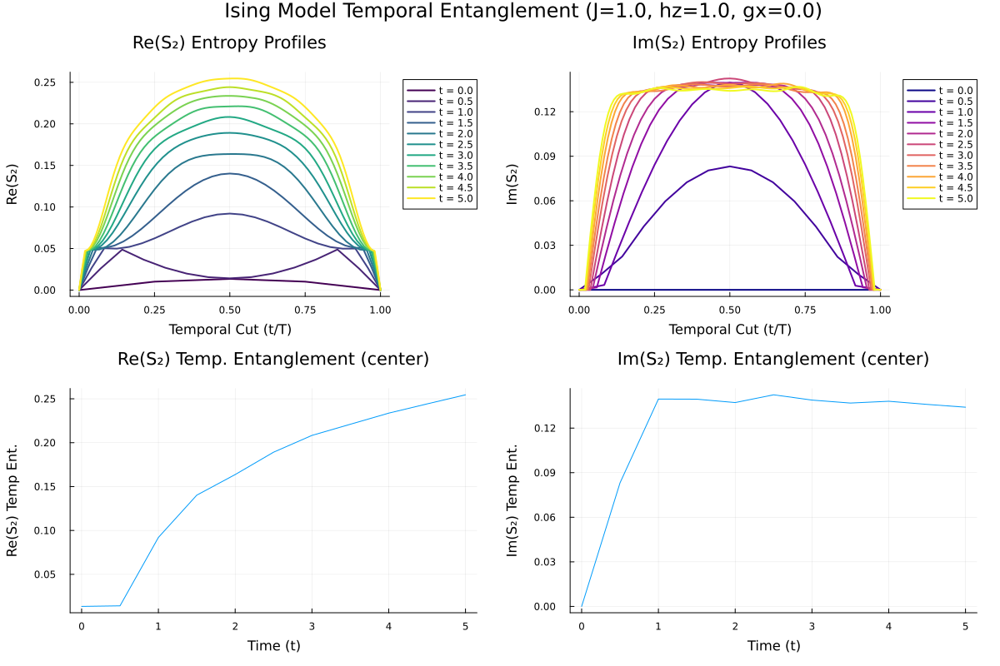

([0.0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0], [0.013442993109638255, 0.014102752099510455, 0.09204816428252244, 0.1402332904892373, 0.16369849897111236, 0.18918121426074172, 0.20831978579183508, 0.22102073722442547, 0.23369203372674807, 0.24421698162182212, 0.25456833749756763], [-0.0, 0.08315938762786883, 0.13953862971338396, 0.13945301855379724, 0.13717705927164592, 0.14239419977274617, 0.1388467266615361, 0.13684800445115622, 0.13805181611124479, 0.13594227807597523, 0.13405374619866378])

In [4]:
# Test times from t=0.2 to t=2.0
test_times = collect(0.0 : 0.5 : 5.0)

# Execute the simulation
times, c_real, c_imag = plot_ising_entropy_evolution(
    test_times;
    JXX = 1.0, 
    hz = 1.0,   # Transverse field (Set to 1.0 for the critical point if gx=0)
    gx = 0.0,   # Longitudinal field
    dt = 0.05,
    maxdim = 150
)

---

$ p=0.0 $

[PM LR|RTM] L=54, cutoff=1.0e-12, maxdim=250, normalize=overlap)   6%  ETA: 0:01:45 (22.42 ms/it)
   Info: [307]  chi=8 | ds=0.0001813904218795903 | <R|Rprev> = -8.949759190536434e-8┌ Warning: PM Stuck after 201/312 steps | ds=0.00018533580631252544 | chi=8)
└ @ ITransverse ~/.julia/packages/ITransverse/8pmYI/src/power_method/pm.jl:151
Progress: 100%|█████████████████████████████████████████| Time: 0:01:01


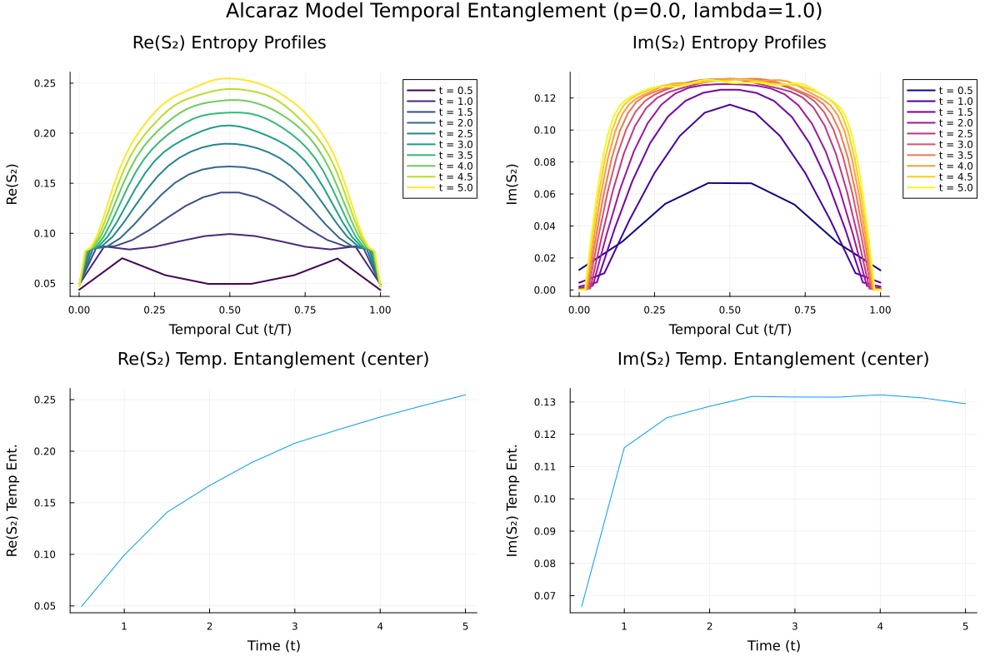

([0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0], [0.049505213887673254, 0.09930500569397838, 0.14075322957934971, 0.1667664782976154, 0.18925931436325832, 0.20775624650702676, 0.22070316498885112, 0.23310685134164352, 0.24418893382191484, 0.2546908736391131], [0.06668372949921739, 0.1158536264623445, 0.1251509890401915, 0.1286682890212573, 0.13174094661523023, 0.1315409768602, 0.13151034552997792, 0.13222892452795898, 0.1312626316912492, 0.12946457497179406])

In [4]:
target_times = collect(0.5 : 0.5 : 5.0)
mpo_generator = expH_alcaraz
p_val = 0.0

times, c_real, c_imag = plot_entropy_evolution(
    mpo_generator, target_times; 
    p=p_val, lambda=1.0,
    dt=0.1, maxdim=250, alg="RTM"
)

[PM LR|densitymatrix] L=54, cutoff=1.0e-12, maxdim=250, normalize=overlap)   2%  ETA: 0:11:01 ( 0.14  s/it)
   Info: [112]  chi=24 | ds=8.970752569670282e-6 | <R|Rprev> = -7.060235318189922e-11[ Info: PM Converged after 114 steps | ds=9.426281074587095e-7 | chi=24)
Progress: 100%|█████████████████████████████████████████| Time: 0:00:41


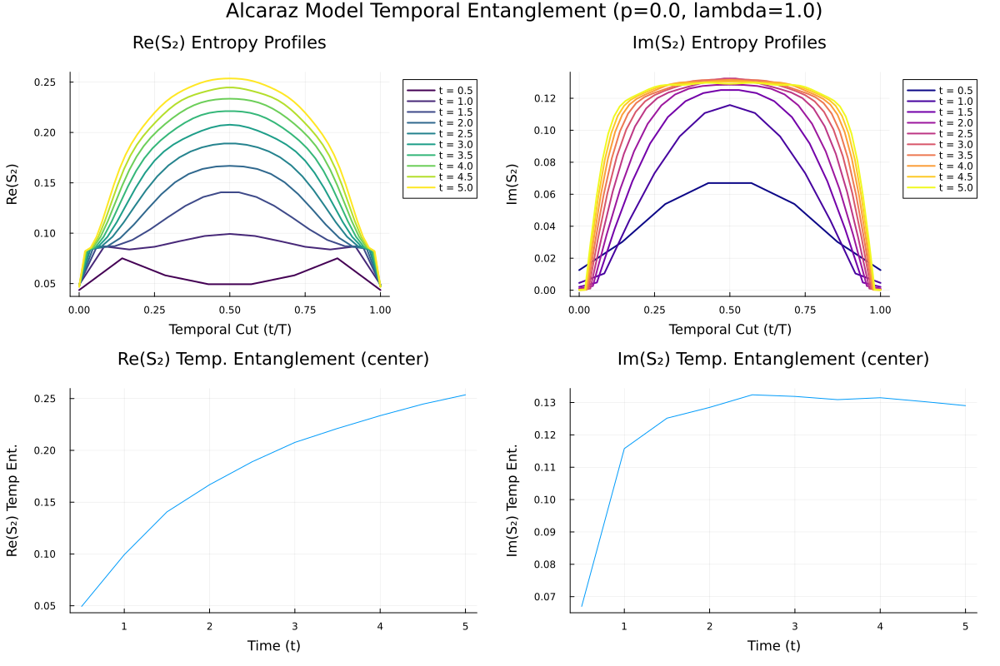

([0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0], [0.04938340595531105, 0.09930126555130488, 0.1406262917031073, 0.16685995905229284, 0.18903412048823698, 0.20768214206821176, 0.22117933137167448, 0.23350489727309642, 0.2446399174683692, 0.2536234132197119], [0.06698751913168154, 0.1157624226001192, 0.1251570894849546, 0.1284924262052174, 0.1323782539297621, 0.1318801234009969, 0.13088379482183193, 0.13147457541518384, 0.1303030747231186, 0.12902756743993934])

In [5]:
target_times = collect(0.5 : 0.5 : 5.0)
mpo_generator = expH_alcaraz
p_val = 0.0

times, c_real, c_imag = plot_entropy_evolution(
    mpo_generator, target_times; 
    p=p_val, lambda=1.0,
    dt=0.1, maxdim=250, alg="densitymatrix"
)

[PM LR|RTM] L=104, cutoff=1.0e-12, maxdim=250, normalize=overlap)   7%  ETA: 0:03:36 (46.28 ms/it)
   Info: [333]  chi=8 | ds=0.0001625768290350882 | <R|Rprev> = -3.781556935110986e-9┌ Warning: PM Stuck after 201/334 steps | ds=0.00013013863797317615 | chi=8)
└ @ ITransverse ~/.julia/packages/ITransverse/8pmYI/src/power_method/pm.jl:151
Progress: 100%|█████████████████████████████████████████| Time: 0:00:34


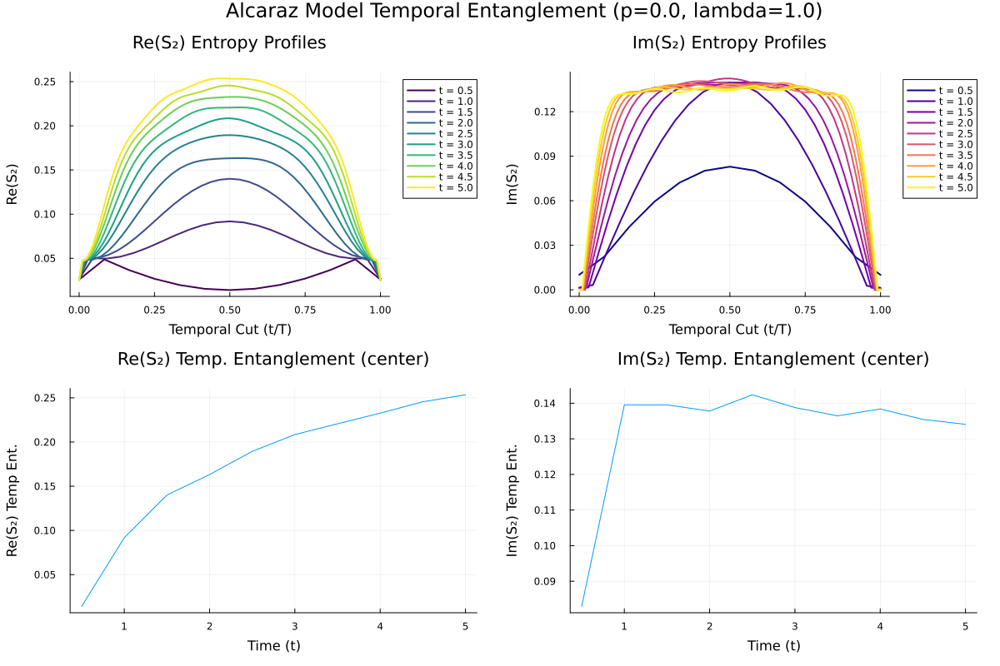

([0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0], [0.014028284742173502, 0.091789321314314, 0.14000332861800713, 0.16323466385550095, 0.1894506580832988, 0.20846812123515404, 0.22065356431127983, 0.23267344295479106, 0.24555918620750183, 0.25341456202233426], [0.08293382768976876, 0.13952229078566344, 0.13953925934453615, 0.1378040714031436, 0.14236280458333808, 0.13878348233460078, 0.1364470433546552, 0.13839300499401852, 0.1354547189266543, 0.134070783413315])

In [6]:
target_times = collect(0.5 : 0.5 : 5.0)
mpo_generator = expH_alcaraz
p_val = 0.0

times, c_real, c_imag = plot_entropy_evolution(
    mpo_generator, target_times; 
    p=p_val, lambda=1.0,
    dt=0.05, maxdim=250, alg="RTM"
)

[PM LR|densitymatrix] L=104, cutoff=1.0e-12, maxdim=250, normalize=overlap)   3%  ETA: 0:26:12 ( 0.32  s/it)
   Info: [157]  chi=24 | ds=6.497720232867543e-6 | <R|Rprev> = -4.7441576308452443e-11[ Info: PM Converged after 158 steps | ds=7.869518687253496e-7 | chi=24)
Progress: 100%|█████████████████████████████████████████| Time: 0:01:53


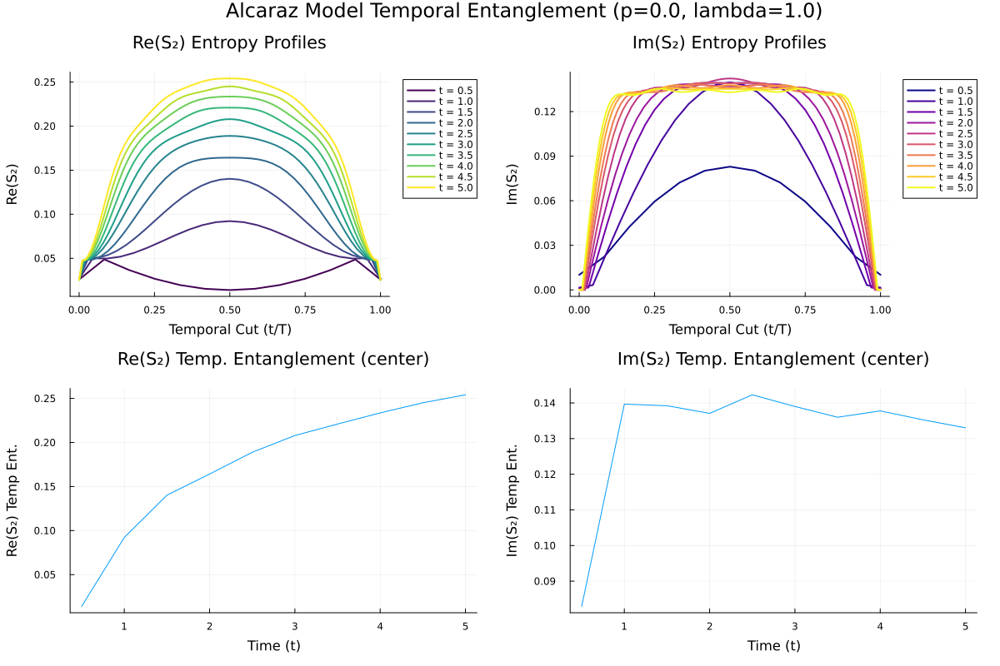

([0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0], [0.013896232048724253, 0.09215314903105087, 0.140188250211011, 0.16418232960683424, 0.18888622980767758, 0.20791682400524264, 0.22094486548639158, 0.2335849612000936, 0.2451078376531227, 0.25411477097941704], [0.0829148798095547, 0.13966848609062715, 0.13921854097373423, 0.13707803090001874, 0.14228397189059822, 0.1390115462095896, 0.13598754081561717, 0.13777534125329222, 0.13527679983698604, 0.13300913912335136])

In [7]:
target_times = collect(0.5 : 0.5 : 5.0)
mpo_generator = expH_alcaraz
p_val = 0.0

times, c_real, c_imag = plot_entropy_evolution(
    mpo_generator, target_times; 
    p=p_val, lambda=1.0,
    dt=0.05, maxdim=250, alg="densitymatrix"
)

[PM LR|RTM] L=504, cutoff=1.0e-12, maxdim=250, normalize=overlap)   6%  ETA: 0:19:11 ( 0.25  s/it)
   Info: [320]  chi=7 | ds=2.5595659705057727e-6 | <R|Rprev> = -1.1295197581484033e-13[ Info: PM Converged after 321 steps | ds=9.270151102303004e-7 | chi=7)
Progress: 100%|█████████████████████████████████████████| Time: 0:03:50


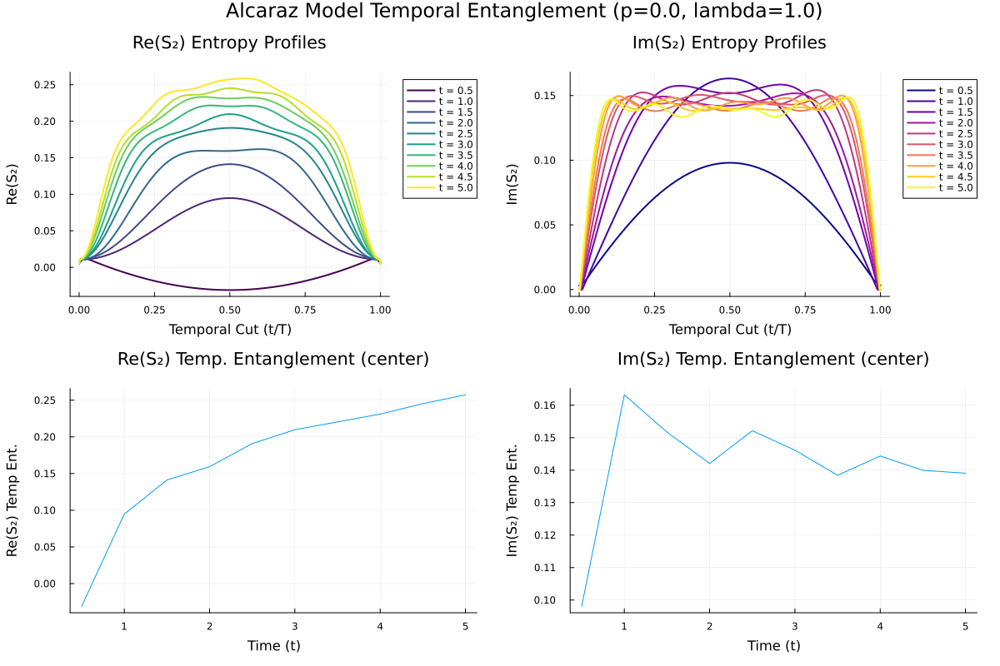

([0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0], [-0.031107288690420256, 0.09481581426834347, 0.1412051151483383, 0.15935320282017654, 0.19089787133738126, 0.20974806221214534, 0.22039398303036908, 0.23111683151524176, 0.2452744913175783, 0.25733700320589], [0.09803332537686114, 0.16320425062969565, 0.1517049836647101, 0.14205803513777787, 0.1521367189606719, 0.14615409955505718, 0.13842505401851685, 0.14435938247963068, 0.1399294213627436, 0.13906012463722603])

In [8]:
target_times = collect(0.5 : 0.5 : 5.0)
mpo_generator = expH_alcaraz
p_val = 0.0

times, c_real, c_imag = plot_entropy_evolution(
    mpo_generator, target_times; 
    p=p_val, lambda=1.0,
    dt=0.01, maxdim=250, alg="RTM"
)

[PM LR|densitymatrix] L=504, cutoff=1.0e-12, maxdim=250, normalize=overlap)   5%  ETA: 1:44:29 ( 1.32  s/it)
   Info: [266]  chi=23 | ds=2.02912228897123e-6 | <R|Rprev> = -1.5579407252810972e-12[ Info: PM Converged after 267 steps | ds=9.005611006640546e-7 | chi=23)
Progress: 100%|█████████████████████████████████████████| Time: 0:13:18


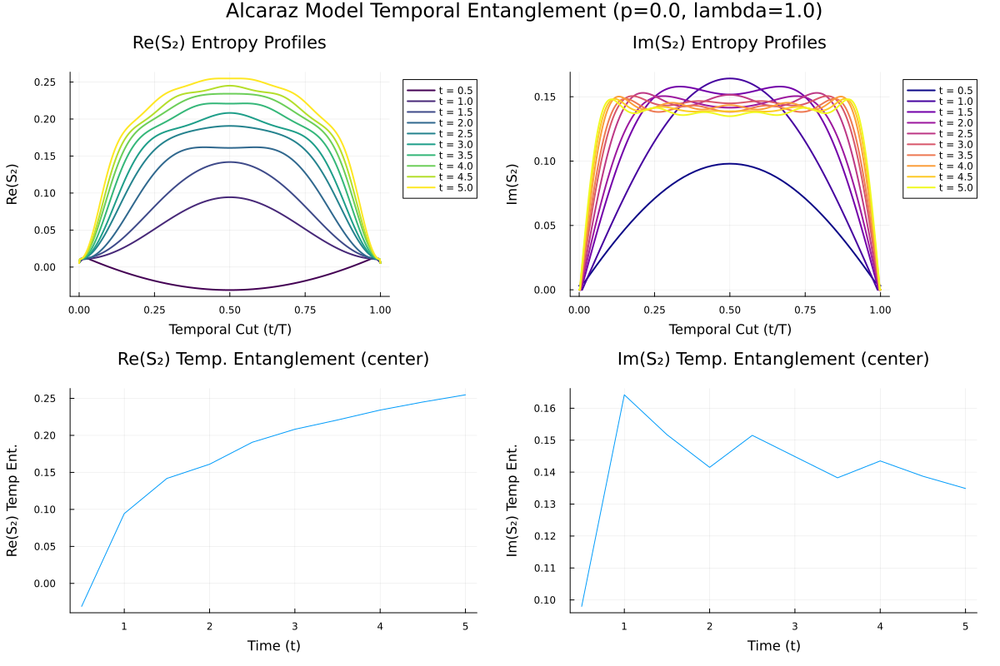

([0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0], [-0.031068999307135386, 0.09436322565578824, 0.14187866602817353, 0.16101085028351625, 0.1906819322593058, 0.2082463007498847, 0.22080212772391822, 0.234214979751947, 0.2450409462003178, 0.25479068718167663], [0.09797098099486197, 0.16419796083714105, 0.15171649451971506, 0.1414955330509349, 0.15150489627296546, 0.14485986038876167, 0.13822471438161077, 0.14350267303249334, 0.13871302729218876, 0.13488057359712086])

In [9]:
target_times = collect(0.5 : 0.5 : 5.0)
mpo_generator = expH_alcaraz
p_val = 0.0

times, c_real, c_imag = plot_entropy_evolution(
    mpo_generator, target_times; 
    p=p_val, lambda=1.0,
    dt=0.01, maxdim=250, alg="densitymatrix"
)

probando para distintos dt, vemos que el "sweet spot" para nuestras simulaciones (donde observamos mejor correlación con Ising) se encuentra alrededor de **$dt=0.05$**

para dt más grande, el error de Trotter es mayor, mientras que para dt más pequeños, se vuelve más complicado truncar las tMPS y PowerMethod oscila más y tenemos peores resultados por algún motivo (tengo que estudiar más en detalle por qué ocurre esto)

---

Vamos a probar para $dt=0.05$ distintos valores de $p$ (hasta $p=1.5$ where the Alcaraz Model leaves the Ising's universality class)

In [12]:
# helper functions (same as plot_entropy_evolution but only profiles, no center growth)

function plot_entropy_profiles(
    mpo_generator::Function, 
    target_times::Vector{Float64};
    p::Float64=0.0, lambda::Float64=1.0,
    dt::Float64=0.1, cutoff::Float64=1e-12, maxdim::Int=256, 
    alg::String="RTM", eps_converged::Float64=1e-6, nbeta::Int=4
)
    plt_real = plot(title="Re(S₂) Entropy Profiles", xlabel="Temporal Cut (t/T)", ylabel="Re(S₂)", 
                    legend=:outerright, grid=true, framestyle=:box)
    plt_imag = plot(title="Im(S₂) Entropy Profiles", xlabel="Temporal Cut (t/T)", ylabel="Im(S₂)", 
                    legend=:outerright, grid=true, framestyle=:box)

    n_times = length(target_times)
    colors_real = cgrad(:viridis, n_times, categorical=true)
    colors_imag = cgrad(:plasma, n_times, categorical=true)

    @showprogress "Computing Profiles for p=$p..." for (i, T) in enumerate(target_times)
        bonds, r2_re, r2_im, _ = compute_alcaraz_entropies(
            mpo_generator, T; 
            lambda=lambda, p=p, dt=dt, cutoff=cutoff, maxdim=maxdim, 
            alg=alg, eps_converged=eps_converged, nbeta=nbeta
        )

        # Normalize x axis (Temporal Cut t/T)
        n_bonds = length(r2_re)
        x_normalized = range(0.0, 1.0, length=n_bonds)
        
        time_label = "t = $(round(T, digits=1))"
        
        plot!(plt_real, x_normalized, r2_re, label=time_label, lw=2, color=colors_real[i])
        plot!(plt_imag, x_normalized, r2_im, label=time_label, lw=2, color=colors_imag[i])
    end

    # 1x2 layout
    final_plot = plot(
        plt_real, plt_imag, 
        layout=(1, 2), 
        size=(1200, 450), # Adjusted aspect ratio for a 1x2 spread
        margin=5Plots.mm,
        plot_title="Alcaraz Model Temporal Entanglement (p=$p, lambda=$lambda)"
    )
    
    return final_plot
end

plot_entropy_profiles (generic function with 1 method)

---
$p=0.1$

[PM LR|RTM] L=54, cutoff=1.0e-12, maxdim=250, normalize=overlap)  10%  ETA: 0:03:45 (49.76 ms/it)
   Info: [488]  chi=8 | ds=9.149441114791879e-5 | <R|Rprev> = -1.6068251801954543e-7┌ Warning: PM Stuck after 201/491 steps | ds=5.297828999784038e-5 | chi=8)
└ @ ITransverse ~/.julia/packages/ITransverse/8pmYI/src/power_method/pm.jl:151
Computing Profiles for p=0.1... 100%|████████████████████| Time: 0:00:56


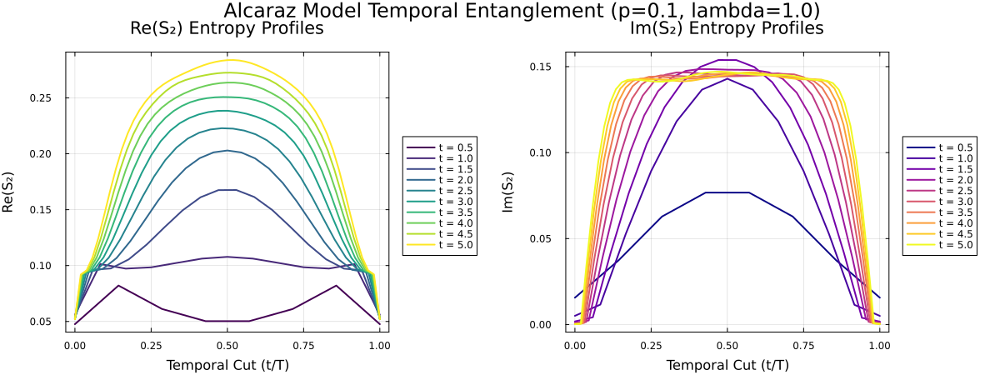

In [13]:
target_times = collect(0.5 : 0.5 : 5.0)


p_val=0.1
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.1, maxdim=250, alg="RTM"
)

display(fig)


[PM LR|densitymatrix] L=54, cutoff=1.0e-12, maxdim=250, normalize=overlap)   5%  ETA: 1:12:46 ( 0.92  s/it)
   Info: [261]  chi=34 | ds=1.648507471530003e-6 | <R|Rprev> = -1.4447363141214367e-9[ Info: PM Converged after 262 steps | ds=9.6108200703382e-7 | chi=34)
Computing Profiles for p=0.1... 100%|████████████████████| Time: 0:08:21


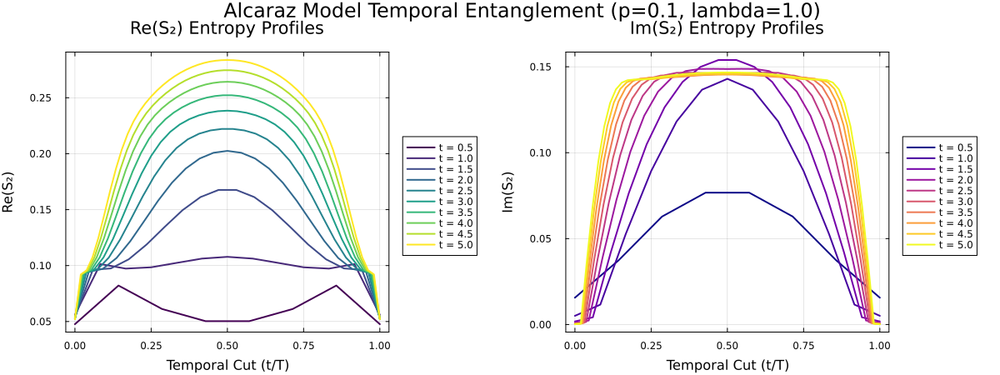

In [14]:
target_times = collect(0.5 : 0.5 : 5.0)


p_val=0.1
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.1, maxdim=250, alg="densitymatrix"
)

display(fig)


[PM LR|RTM] L=104, cutoff=1.0e-12, maxdim=250, normalize=overlap)  17%  ETA: 0:06:57 ( 0.10  s/it)
   Info: [841]  chi=8 | ds=0.00010484917359471213 | <R|Rprev> = -7.015913915429618e-8┌ Warning: PM Stuck after 201/842 steps | ds=0.00016931134396014347 | chi=8)
└ @ ITransverse ~/.julia/packages/ITransverse/8pmYI/src/power_method/pm.jl:151
Computing Profiles for p=0.1... 100%|████████████████████| Time: 0:03:32


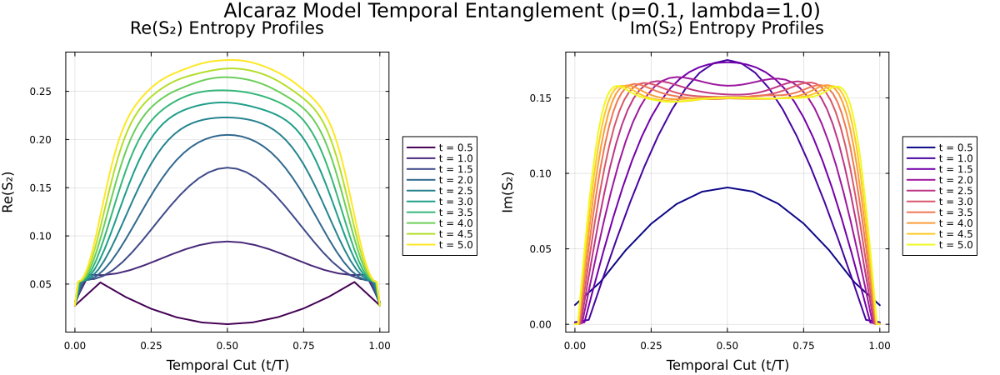

In [15]:
target_times = collect(0.5 : 0.5 : 5.0)


p_val=0.1
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.05, maxdim=250, alg="RTM"
)

display(fig)


[PM LR|densitymatrix] L=104, cutoff=1.0e-12, maxdim=250, normalize=overlap)  11%  ETA: 2:32:29 ( 2.05  s/it)
   Info: [534]  chi=36 | ds=1.1778094533010375e-6 | <R|Rprev> = -1.0134436601882102e-9[ Info: PM Converged after 535 steps | ds=8.563418295581826e-7 | chi=36)
Computing Profiles for p=0.1... 100%|████████████████████| Time: 0:35:52


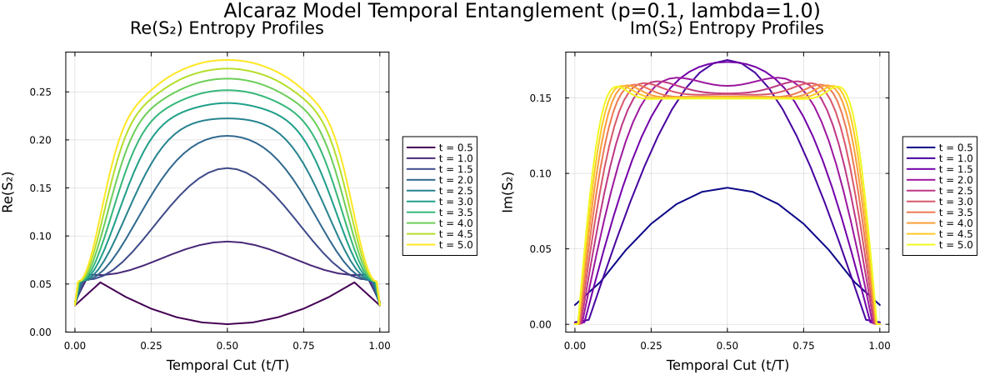

In [16]:
target_times = collect(0.5 : 0.5 : 5.0)


p_val=0.1
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.05, maxdim=250, alg="densitymatrix"
)

display(fig)


[PM LR|RTM] L=104, cutoff=1.0e-12, maxdim=250, normalize=overlap)  17%  ETA: 0:07:50 ( 0.11  s/it)
   Info: [840]  chi=8 | ds=0.00016828590301409818 | <R|Rprev> = -1.2035208159126672e-8┌ Warning: PM Stuck after 201/842 steps | ds=0.00016931134396014347 | chi=8)
└ @ ITransverse ~/.julia/packages/ITransverse/8pmYI/src/power_method/pm.jl:151
Computing Profiles for p=0.1... 100%|████████████████████| Time: 0:03:51


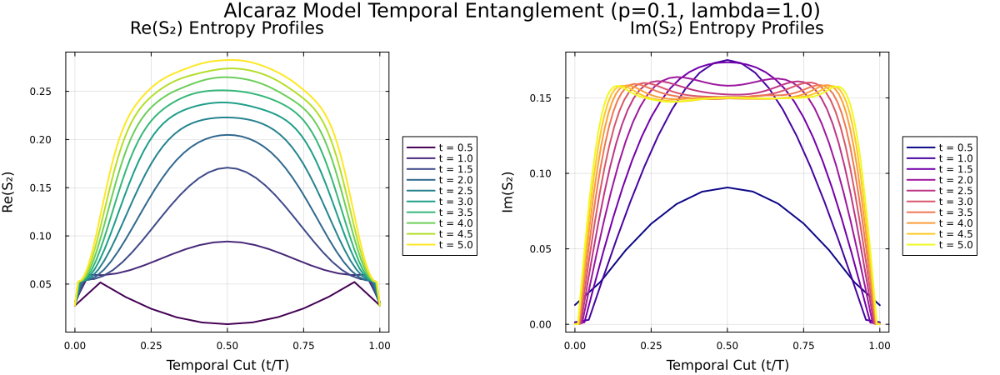

In [18]:
target_times = collect(0.5 : 0.5 : 5.0)


p_val=0.1
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.05, maxdim=250, alg="RTM"
)

display(fig)


[PM LR|RTM] L=504, cutoff=1.0e-12, maxdim=250, normalize=overlap)  28%  ETA: 0:43:44 ( 0.73  s/it)
   Info: [1398]  chi=10 | ds=0.057098304321847856 | <R|Rprev> = -3.324487140052158e-6┌ Warning: PM Stuck after 201/1399 steps | ds=0.02351147475251769 | chi=10)
└ @ ITransverse ~/.julia/packages/ITransverse/8pmYI/src/power_method/pm.jl:151
Computing Profiles for p=0.1... 100%|████████████████████| Time: 0:35:30


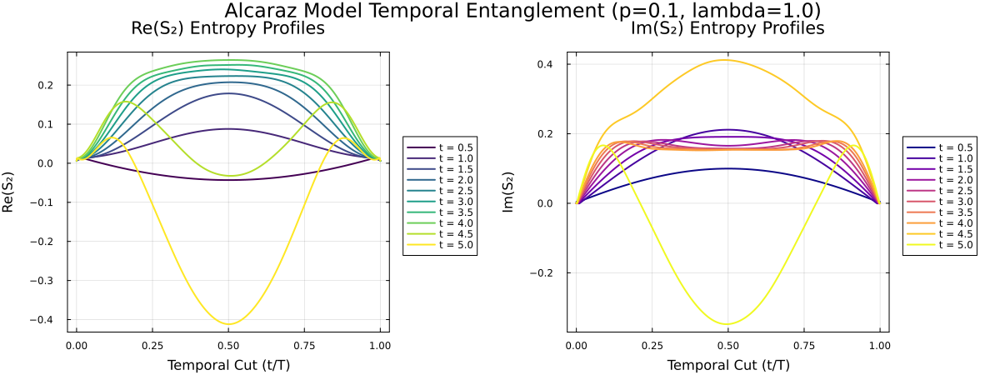

In [19]:
target_times = collect(0.5 : 0.5 : 5.0)


p_val=0.1
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.01, maxdim=250, alg="RTM"
)

display(fig)


vemos que la simulación se rompe al hacer dt's muy pequeños (posiblemente porque, como la transition matrix crece considerablemente, el error que se suele cometer al hacer RTM explota)

vamos a mirar a tiempos largos a ver qué ocurre

[PM LR|RTM] L=84, cutoff=1.0e-12, maxdim=250, normalize=overlap)   8%  ETA: 0:15:41 ( 0.20  s/it)
   Info: [390]  chi=13 | ds=0.019320979291923585 | <R|Rprev> = -4.584327084642509e-5┌ Warning: PM Stuck after 201/391 steps | ds=0.021444648128754684 | chi=13)
└ @ ITransverse ~/.julia/packages/ITransverse/8pmYI/src/power_method/pm.jl:151


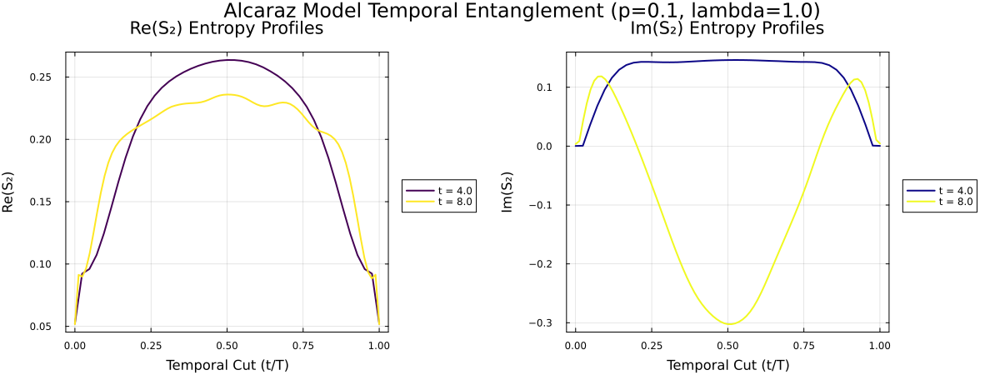

In [22]:
target_times = collect(4.0 : 4.0 : 8.0)


p_val=0.1
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.1, maxdim=250, alg="RTM"
)

display(fig)


[PM LR|RTM] L=244, cutoff=1.0e-12, maxdim=250, normalize=overlap)  22%  ETA: 1:31:51 ( 1.42  s/it)
   Info: [1119]  chi=14 | ds=0.0005031132502295588 | <R|Rprev> = -1.0694223294966833e-6┌ Warning: PM Stuck after 201/1120 steps | ds=0.0005865263695247758 | chi=14)
└ @ ITransverse ~/.julia/packages/ITransverse/8pmYI/src/power_method/pm.jl:151
Computing Profiles for p=0.1... 100%|████████████████████| Time: 0:34:20


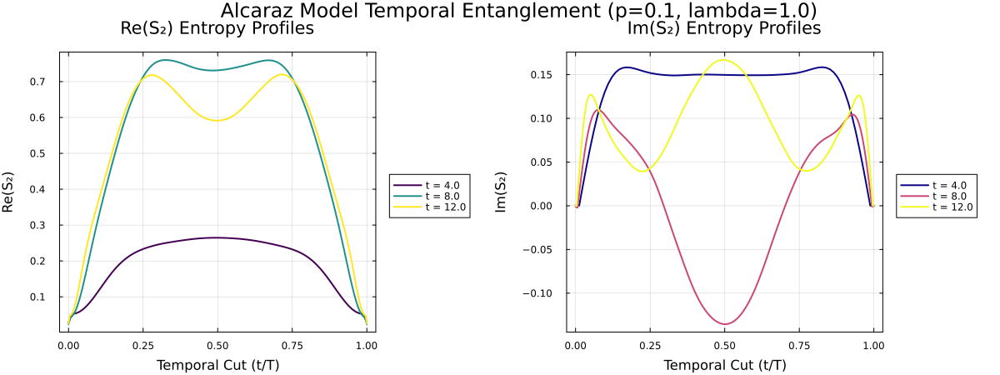

In [ ]:
target_times = collect(4.0 : 4.0 : 8.0)


p_val=0.1
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.05, maxdim=250, alg="RTM"
)

display(fig)


[PM LR|RTM] L=404, cutoff=1.0e-12, maxdim=250, normalize=overlap)  26%  ETA: 0:54:14 ( 0.88  s/it)
   Info: [1310]  chi=13 | ds=0.0013929097108397182 | <R|Rprev> = -1.0509705296739184e-6┌ Warning: PM Stuck after 201/1311 steps | ds=0.001002691480573692 | chi=13)
└ @ ITransverse ~/.julia/packages/ITransverse/8pmYI/src/power_method/pm.jl:151


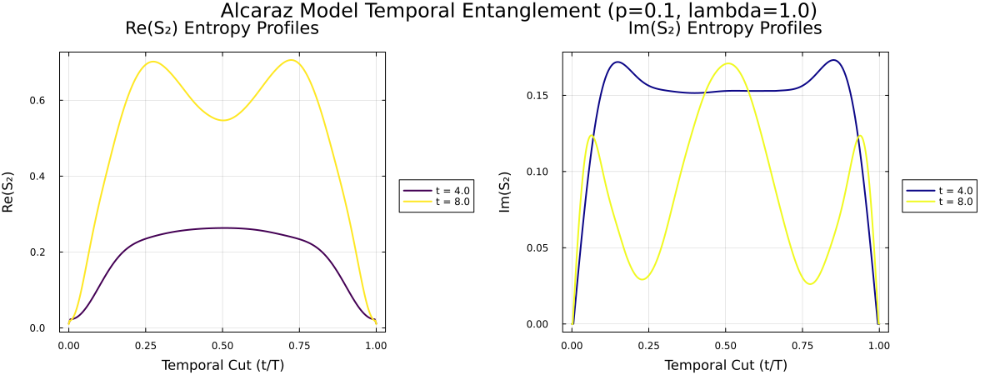

In [23]:
target_times = collect(4.0 : 4.0 : 8.0)


p_val=0.1
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.02, maxdim=250, alg="RTM"
)

display(fig)


probar ahroa diferentes nbeta como 12

---
$p=0.3$

[PM LR|RTM] L=54, cutoff=1.0e-12, maxdim=250, normalize=overlap)   7%  ETA: 0:09:24 ( 0.12  s/it)
   Info: [368]  chi=13 | ds=4.400190340436705e-5 | <R|Rprev> = -8.919502338368669e-10┌ Warning: PM Stuck after 201/369 steps | ds=3.914142089700423e-5 | chi=13)
└ @ ITransverse ~/.julia/packages/ITransverse/8pmYI/src/power_method/pm.jl:151
Computing Profiles for p=0.3... 100%|████████████████████| Time: 0:02:55


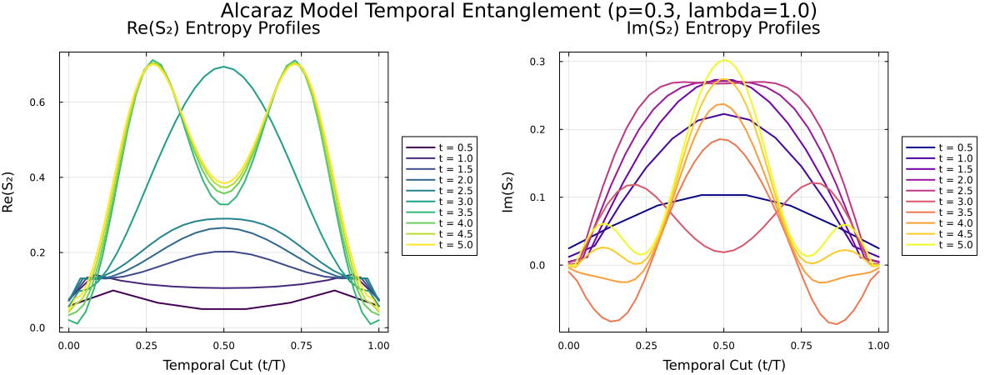

In [25]:
target_times = collect(0.5 : 0.5 : 5.0)


p_val=0.3
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.1, maxdim=250, alg="RTM"
)

display(fig)


[PM LR|RTM] L=104, cutoff=1.0e-12, maxdim=250, normalize=overlap)   6%  ETA: 0:18:46 ( 0.24  s/it)
   Info: [298]  chi=12 | ds=1.2200547540308637e-6 | <R|Rprev> = -1.6777177937508615e-14[ Info: PM Converged after 299 steps | ds=9.08879182359712e-7 | chi=12)
Computing Profiles for p=0.3... 100%|████████████████████| Time: 0:04:44


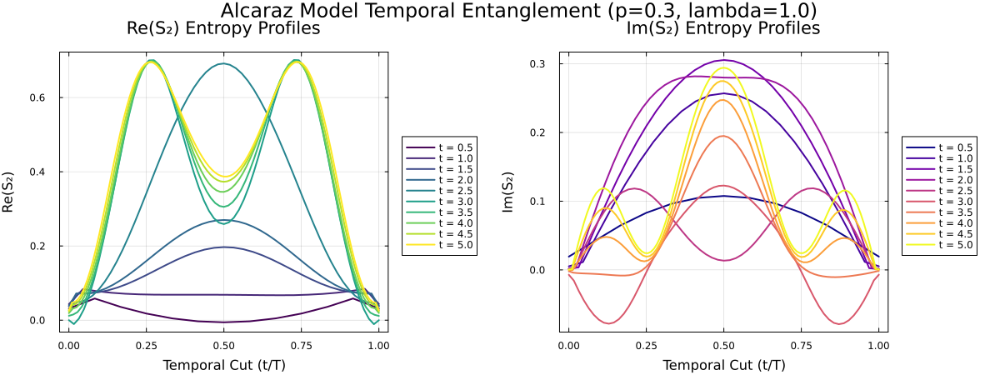

In [24]:
target_times = collect(0.5 : 0.5 : 5.0)


p_val=0.3
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.05, maxdim=250, alg="RTM"
)

display(fig)


[PM LR|RTM] L=504, cutoff=1.0e-12, maxdim=250, normalize=overlap)  12%  ETA: 1:32:46 ( 1.26  s/it)
   Info: [580]  chi=13 | ds=0.021914435153115863 | <R|Rprev> = -0.00048020462196913486┌ Warning: PM Stuck after 201/581 steps | ds=0.013526060270007217 | chi=13)
└ @ ITransverse ~/.julia/packages/ITransverse/8pmYI/src/power_method/pm.jl:151
Computing Profiles for p=0.3... 100%|████████████████████| Time: 0:29:12


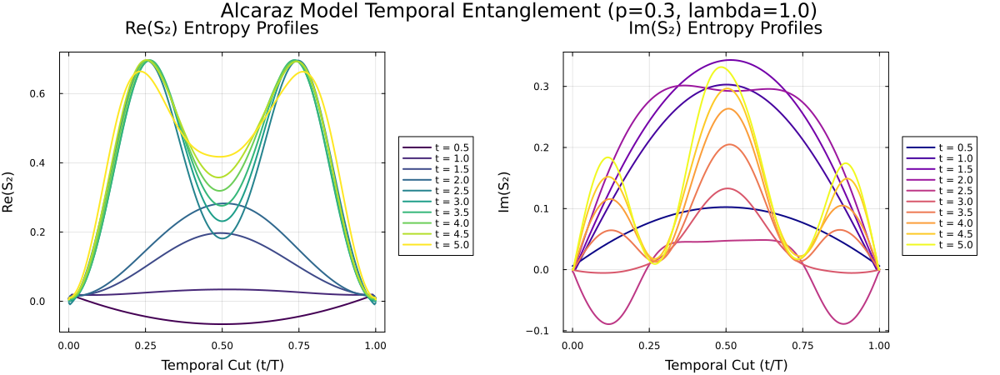

In [26]:
target_times = collect(0.5 : 0.5 : 5.0)


p_val=0.3
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.01, maxdim=250, alg="RTM"
)

display(fig)


[PM LR|densitymatrix] L=104, cutoff=1.0e-12, maxdim=250, normalize=overlap)   4%  ETA: 12:55:32 ( 9.68  s/it)
   Info: [194]  chi=82 | ds=1.046452369257711e-6 | <R|Rprev> = -2.7472767650548436e-12[ Info: PM Converged after 195 steps | ds=8.241836760847221e-7 | chi=82)
Computing Profiles for p=0.3... 100%|████████████████████| Time: 0:54:25


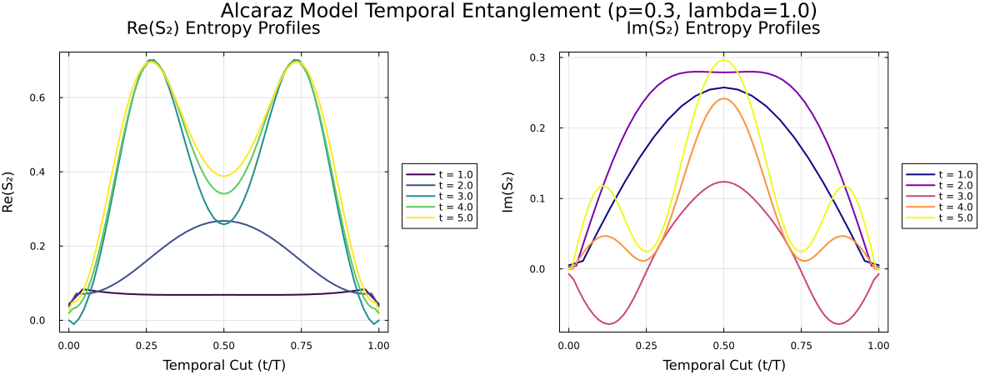

In [30]:
target_times = collect(1.0 : 1.0 : 5.0)


p_val=0.3
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.05, maxdim=250, alg="densitymatrix"
)

display(fig)


[PM LR|RTM] L=29, cutoff=1.0e-12, maxdim=250, normalize=overlap)   7%  ETA: 0:05:03 (65.23 ms/it)
   Info: [349]  chi=14 | ds=1.0097334741443476e-5 | <R|Rprev> = -3.012607188999784e-8┌ Warning: PM Stuck after 201/352 steps | ds=1.0097895009497648e-5 | chi=14)
└ @ ITransverse ~/.julia/packages/ITransverse/8pmYI/src/power_method/pm.jl:151
Computing Profiles for p=0.3... 100%|████████████████████| Time: 0:00:53


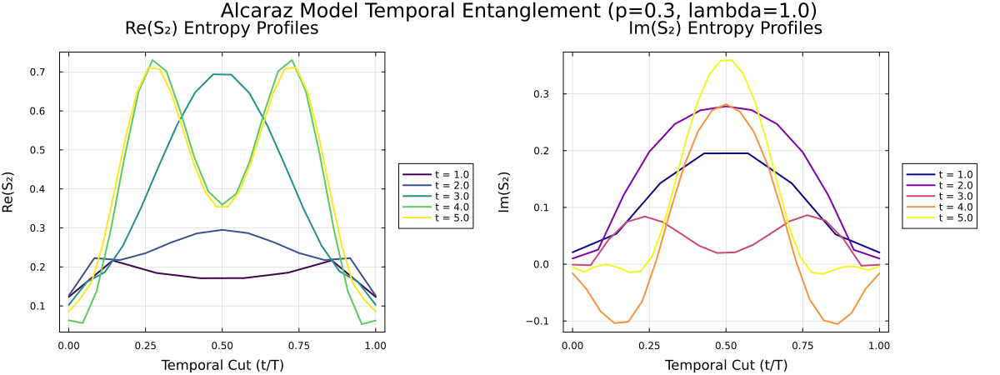

In [31]:
target_times = collect(1.0 : 1.0 : 5.0)


p_val=0.3
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.2, maxdim=250, alg="RTM"
)

display(fig)


[PM LR|densitymatrix] L=54, cutoff=1.0e-12, maxdim=250, normalize=overlap)   3%  ETA: 6:37:58 ( 4.95  s/it)
   Info: [174]  chi=81 | ds=1.2221641210730105e-6 | <R|Rprev> = -1.5558747705839508e-13[ Info: PM Converged after 175 steps | ds=7.744331163017648e-7 | chi=81)
Computing Profiles for p=0.3... 100%|████████████████████| Time: 0:29:27


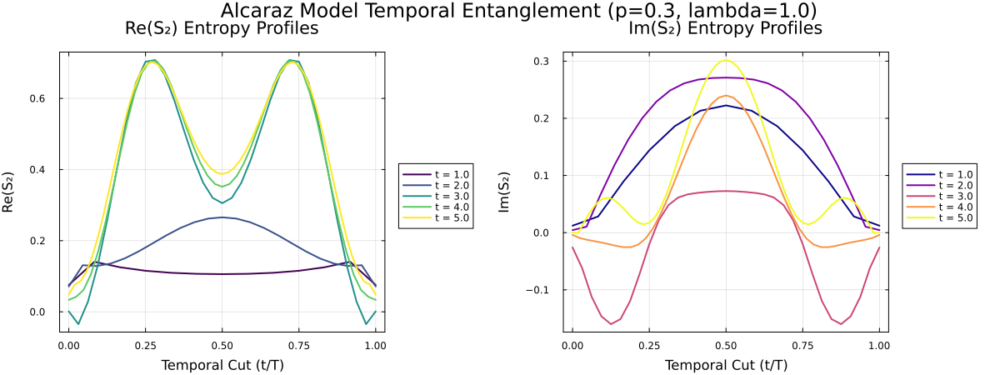

In [32]:
target_times = collect(1.0 : 1.0 : 5.0)


p_val=0.3
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.1, maxdim=250, alg="densitymatrix"
)

display(fig)


---
$p=0.5$

[PM LR|RTM] L=54, cutoff=1.0e-12, maxdim=250, normalize=overlap)   7%  ETA: 0:21:25 ( 0.28  s/it)
   Info: [353]  chi=17 | ds=1.0907644627800028e-6 | <R|Rprev> = -1.5383951000334539e-7[ Info: PM Converged after 354 steps | ds=9.746141612365644e-7 | chi=17)
Computing Profiles for p=0.5... 100%|████████████████████| Time: 0:02:06


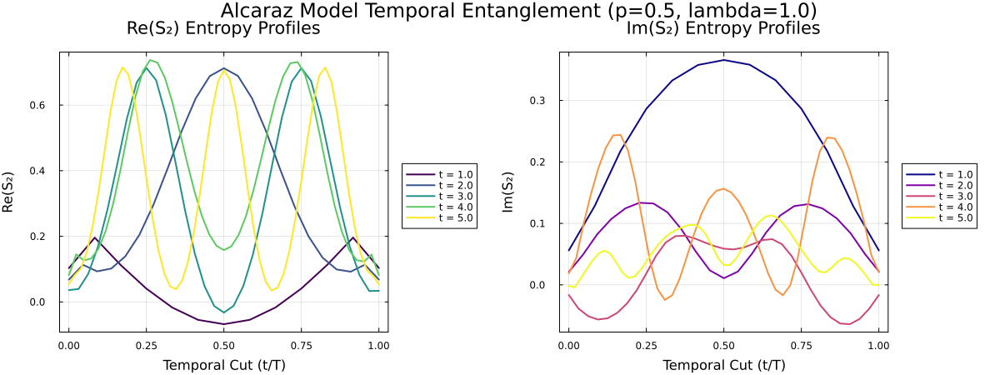

In [33]:
target_times = collect(1.0 : 1.0 : 5.0)

p_val=0.5

fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.1, maxdim=250, alg="RTM"
)

display(fig)


[PM LR|RTM] L=24, cutoff=1.0e-12, maxdim=250, normalize=overlap)   1%  ETA: 0:03:06 (37.58 ms/it)
   Info: [57]  chi=10 | ds=1.8484361093973334e-6 | <R|Rprev> = -5.78518714415092e-13[ Info: PM Converged after 60 steps | ds=9.635610799252348e-7 | chi=10)
Computing Profiles for p=0.5... 100%|████████████████████| Time: 0:00:06


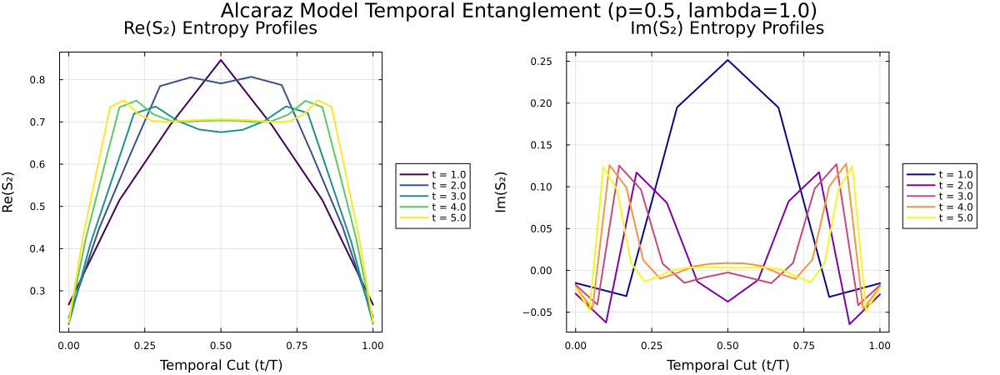

In [34]:
target_times = collect(1.0 : 1.0 : 5.0)

p_val=0.5

fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.25, maxdim=250, alg="RTM"
)

display(fig)


[PM LR|RTM] L=104, cutoff=1.0e-12, maxdim=250, normalize=overlap)   8%  ETA: 0:47:44 ( 0.62  s/it)
   Info: [388]  chi=17 | ds=0.0006215184697612175 | <R|Rprev> = -2.8365683917030127e-6┌ Warning: PM Stuck after 201/389 steps | ds=0.0005683484891420565 | chi=17)
└ @ ITransverse ~/.julia/packages/ITransverse/8pmYI/src/power_method/pm.jl:151
Computing Profiles for p=0.5... 100%|████████████████████| Time: 0:06:23


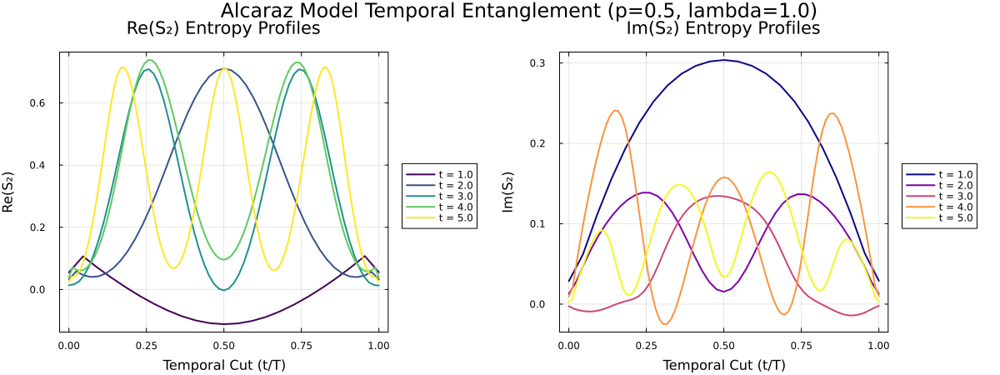

In [35]:
target_times = collect(1.0 : 1.0 : 5.0)

p_val=0.5

fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.05, maxdim=250, alg="RTM"
)

display(fig)


[PM LR|RTM] L=504, cutoff=1.0e-12, maxdim=250, normalize=overlap)   6%  ETA: 3:03:31 ( 2.35  s/it)
   Info: [306]  chi=19 | ds=0.00015880416117897145 | <R|Rprev> = -1.1286143580813146e-7┌ Warning: PM Stuck after 201/307 steps | ds=0.00020474840801981697 | chi=19)
└ @ ITransverse ~/.julia/packages/ITransverse/8pmYI/src/power_method/pm.jl:151
Computing Profiles for p=0.5... 100%|████████████████████| Time: 0:19:56


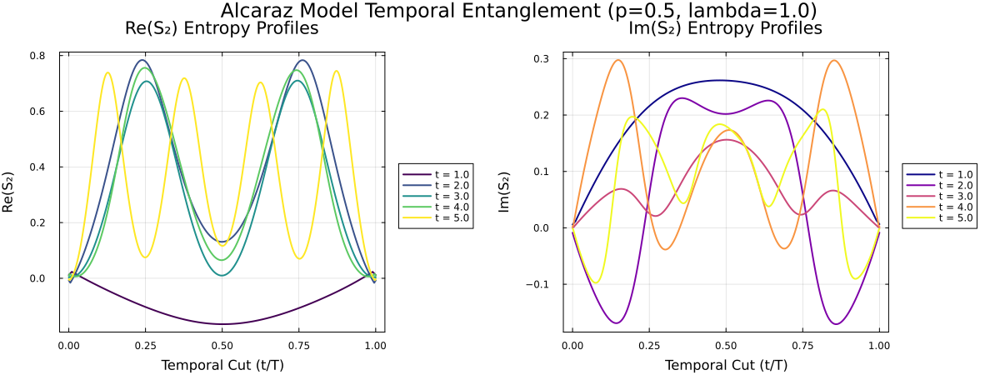

In [36]:
target_times = collect(1.0 : 1.0 : 5.0)


p_val=0.5

fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.01, maxdim=250, alg="RTM"
)

display(fig)


---